<img align="left" src="images/GMIT-logo.png" alt="GMIT" width="250"/>                                                      <img align="right" src="images/data-analytics.png" alt="HDipDA" width="300"/>  
# <center> Higher Diploma in Data Analytics - Boston House Prices Project </center> #
  

___________________________________________

**Module Name**: Machine Learning & Statistics  
**Module Number**: 52954
**Student Name**: Yvonne Brady  
**Student ID**: G00376355  
___________________________________________  


## (20%) Describe: ##
Create a git repository and make it available online for the lecturer to clone. The repository should contain all your work for this assessment. Within the repository, create a jupyter [6] notebook that uses descriptive statistics and plots to describe the Boston House Prices [1] dataset. This part is worth 20% of your overall mark.

## Introduction ##
This project concerns the Boston House Price Dataset. This dataset is taken from 1970 and records a number of parameters as follows:

**_crim_** : per capita crime rate by town.

**_zn_** : proportion of residential land zoned for lots over 25,000 sq.ft.

**_indus_** : proportion of non-retail business acres per town.

**_chas_** : Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).

**_nox_** : nitrogen oxides concentration (parts per 10 million).

**_rm_** : average number of rooms per dwelling.

**_age_** : proportion of owner-occupied units built prior to 1940.

**_dis_** : weighted mean of distances to five Boston employment centres.

**_rad_** : index of accessibility to radial highways.

**_tax_** : full-value property-tax rate per $10,000.

**_ptratio_** : pupil-teacher ratio by town.

**_black_** : 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town.

**_lstat_** : lower status of the population (percent).

**_medv_** : median value of owner-occupied homes in $1000s.

In [1]:
# First things first - import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as ts ## not ~available and warnings when tried to install - will wait for now
%matplotlib inline 
# Found this and thought it was worth trying ...
import pandas_profiling

In [2]:
from sklearn.datasets import load_boston
bhp = load_boston()

In [3]:
print(bhp.keys())

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])


In [4]:
bhp.DESCR

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

### Just Prettying up the Description ###
**Data Set Characteristics:**  
Number of Instances: 506  
Number of Attributes: 13  
**Numeric/categorical predictive.**  
Median Value (attribute 14) is usually the target.
**Attribute Information (in order):**  
- CRIM     per capita crime rate by town  
- ZN       proportion of residential land zoned for lots over 25,000 sq.ft.  
- INDUS    proportion of non-retail business acres per town  
- CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)  
- NOX      nitric oxides concentration (parts per 10 million)  
- RM       average number of rooms per dwelling  
- AGE      proportion of owner-occupied units built prior to 1940  
- DIS      weighted distances to five Boston employment centres  
- RAD      index of accessibility to radial highways  
- TAX      full-value property-tax rate per \\$10,000  
- PTRATIO  pupil-teacher ratio by town  
- B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town  
- LSTAT    % lower status of the population  
- MEDV     Median value of owner-occupied homes in $1000's

**Missing Attribute Values:** None  

**Creator:** Harrison, D. and Rubinfeld, D.L.  
This is a copy of UCI ML housing dataset.
https://archive.ics.uci.edu/ml/machine-learning-databases/housing/  
This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.  
The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic prices and the demand for clean air', J. Environ. Economics & Management, vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics...', Wiley, 1980.  
N.B. Various transformations are used in the table on pages 244-261 of the latter.  
The Boston house-price data has been used in many machine learning papers that address regression problems.  

**References**  
- Belsley, Kuh & Welsch, 'Regression diagnostics: Identifying Influential Data and Sources of Collinearity', Wiley, 1980. 244-261.  
- Quinlan,R. (1993). Combining Instance-Based and Model-Based Learning. In Proceedings on the Tenth International Conference of Machine Learning, 236-243, University of Massachusetts, Amherst. Morgan Kaufmann.

In [5]:
# Put the data in a dataframe for easier manipulation
boston = pd.DataFrame(bhp.data, columns=bhp.feature_names)
# And have a look at some random data
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
368,4.89822,0.0,18.10,0.0,0.631,4.970,100.0,1.3325,24.0,666.0,20.2,375.52,3.26
257,0.61154,20.0,3.97,0.0,0.647,8.704,86.9,1.8010,5.0,264.0,13.0,389.70,5.12
251,0.21409,22.0,5.86,0.0,0.431,6.438,8.9,7.3967,7.0,330.0,19.1,377.07,3.59
317,0.24522,0.0,9.90,0.0,0.544,5.782,71.7,4.0317,4.0,304.0,18.4,396.90,15.94
447,9.92485,0.0,18.10,0.0,0.740,6.251,96.6,2.1980,24.0,666.0,20.2,388.52,16.44


In [6]:
# There is no MEDV column so we must add it to the dataframe
boston['MEDV'] = bhp.target
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
356,8.98296,0.0,18.10,1.0,0.770,6.212,97.4,2.1222,24.0,666.0,20.2,377.73,17.60,17.8
157,1.22358,0.0,19.58,0.0,0.605,6.943,97.4,1.8773,5.0,403.0,14.7,363.43,4.59,41.3
171,2.31390,0.0,19.58,0.0,0.605,5.880,97.3,2.3887,5.0,403.0,14.7,348.13,12.03,19.1
431,10.06230,0.0,18.10,0.0,0.584,6.833,94.3,2.0882,24.0,666.0,20.2,81.33,19.69,14.1
480,5.82401,0.0,18.10,0.0,0.532,6.242,64.7,3.4242,24.0,666.0,20.2,396.90,10.74,23.0


In [7]:
profile = pandas_profiling.ProfileReport(boston)
profile

In [8]:
profile_chas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 1])
profile_chas

In [9]:
profile_nochas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 0])
profile_nochas

In [10]:
# Check for null values
boston.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

## Start Plotting ##

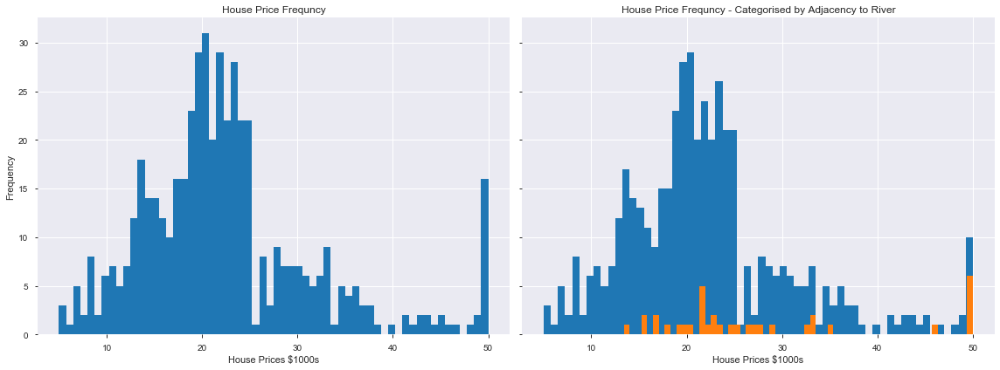

In [11]:

# PLotting histograms showing House Prices in total 
# and where the zone is beside the river
plt.rcParams['figure.figsize'] = [16, 6]
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)
axs[0].set_xlabel('House Prices $1000s')
axs[1].set_xlabel('House Prices $1000s')
axs[0].set_ylabel('Frequency')
axs[0].set_title("House Price Frequncy")
axs[1].set_title("House Price Frequncy - Categorised by Adjacency to River")
axs[0].hist(boston["MEDV"], bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 0.0), bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 1.0), bins = 60)

# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
plt.show()

In [12]:
#Just having a look at the house price element itself
boston["MEDV"].describe()

count    506.000000
mean      22.532806
std        9.197104
min        5.000000
25%       17.025000
50%       21.200000
75%       25.000000
max       50.000000
Name: MEDV, dtype: float64

### What affects house prices? ###
Need to look at each element individually forst to see what affects house prices in particular:  
- CRIM per capita crime rate by town
- ZN proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS proportion of non-retail business acres per town
- NOX nitric oxides concentration (parts per 10 million)
- RM average number of rooms per dwelling
- AGE proportion of owner-occupied units built prior to 1940
- DIS weighted distances to five Boston employment centres
- RAD index of accessibility to radial highways
- TAX full-value property-tax rate per $10,000
- PTRATIO pupil-teacher ratio by town
- B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT % lower status of the population

In [13]:
from scipy import stats
# Get the regression line using all the data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

In [15]:
from tabulate import tabulate

In [16]:

table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+-------------+-------------+-------------+-------------+-------------+
| Category   |       Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+=============+=============+=============+=============+=============+
| CRIM       | -0.36316    |   11.7965   |   -0.388305 | 1.17399e-19 | 0.0383902   |
+------------+-------------+-------------+-------------+-------------+-------------+
| ZN         |  0.914034   |   -9.23212  |    0.360445 | 5.71358e-17 | 0.105363    |
+------------+-------------+-------------+-------------+-------------+-------------+
| INDUS      | -0.360823   |   19.2671   |   -0.483725 | 4.90026e-31 | 0.0290802   |
+------------+-------------+-------------+-------------+-------------+-------------+
| NOX        | -0.00538397 |    0.676011 |   -0.427321 | 7.06504e-24 | 0.000507399 |
+------------+-------------+-------------+-------------+-------------+-------------+
| RM         |  0.0531224  |    5.08764  |    0.69536  | 2.48723e

The table above shows the best correlations with LSTAT (% of population from lower status), which shows an inverse relationship with house price, and RM (number of rooms). This correlates well with the Correlation tables in the profile above. 

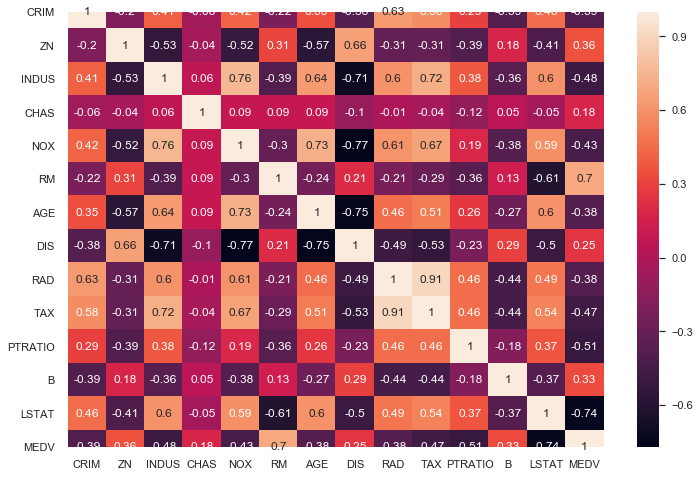

In [17]:
sns.set(rc={'figure.figsize':(12,8)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

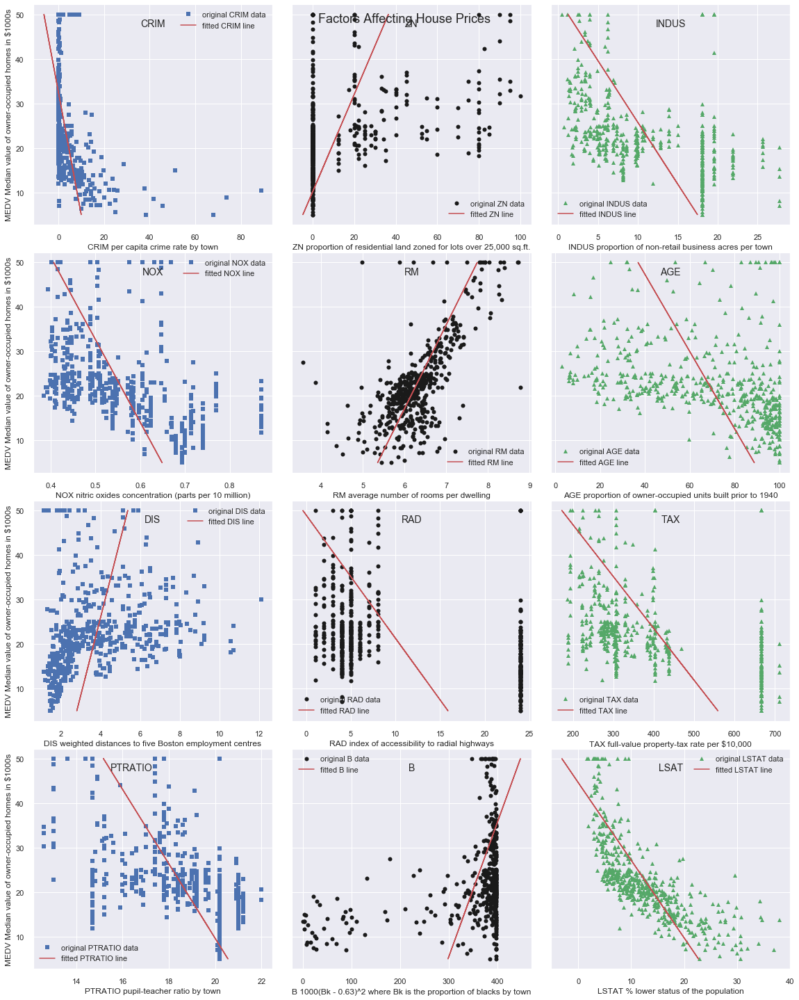

In [18]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

Looking at the plots individually, we can hypothesise on possible correlations. It is likely many of these supposed correlations will be more imagined than real, but we will explore them nonetheless as this may help us spot fake relationships in the future.  
  
**CRIM**: Within the entire dataset there appears to be no relationship, but may warrant further scrutiny where the crime rate is 0.  
**ZN**: Similar to the crime rate. We could look at any relationship where the 0 values are excluded.  
**INDUS**: Could look at excluding house prices under \\$40K   
**NOX**: Similar to INDUS, could exclude the higher priced homes. Unsurprisingly this plot tallies with the INDUS plot.   
**RM**:  A clear linear proportional relationship exists.  
**AGE**: Possible relationship excluding the higher priced homes.  
**DIS**: There may be a $y = a \sqrt{x} $ relationship  
**RAD**: Struggling to find any kind of relationship here.  
**TAX**: Again, no obvious relationship barring a general trend toward higher taxes meaning lower house prices, but the data values are very spread for this to pursue.  
**PTRATIO**: Similar to the TAX plot above  
**B**: Could look at relationship excluding upper-end B values  
**LSTAT**: While this shows one of the best $r^2$ values the shape of the graph may warrant whether a $y=\frac{1}{x}$ may be a better fit here.

It is likely that many of these relationships are not worthy of further investigation.

**Investigation of adjustments described above**

In [19]:
boston_nocrim = boston.loc[boston["CRIM"] > 2]
boston_nozn = boston.loc[boston["ZN"]>5]

In [20]:
crim0_slope, crim0_intercept, crim0_r2, crim0_p, crim0_stdErr = stats.linregress(boston_nocrim["MEDV"], boston_nocrim["CRIM"])
zn0_slope, zn0_intercept, zn0_r2, zn0_p, zn0_stdErr = stats.linregress(boston_nozn["MEDV"], boston_nozn["ZN"])


In [21]:
print("Full dataset r^2 values for CRIM (", len(boston),") vs adjusted CRIM (", len(boston_nocrim),"):", crim_r2, "vs",crim0_r2)
print("Full dataset r^2 values for ZN (", len(boston),") vs adjusted ZN (", len(boston_nozn),"):", zn_r2, "vs", zn0_r2)


Full dataset r^2 values for CRIM ( 506 ) vs adjusted CRIM ( 150 ): -0.3883046085868113 vs -0.3486104206965284
Full dataset r^2 values for ZN ( 506 ) vs adjusted ZN ( 134 ): 0.3604453424505433 vs 0.20841302081053192


**Multi-Linear Regression**  
Looking at the two variables, RM and LSTAt - try using multi-linear regression

In [22]:
# Import linear_model from sklearn
import sklearn.linear_model as ln

In [23]:
# Create a linear regression model instance
m = ln.LinearRegression()

In [24]:
x = boston[["RM","LSTAT"]] # comparing against the best two variables
y = boston["MEDV"]

In [25]:
m.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [26]:
# See how well it fit:
m.score(x,y)

0.6385616062603403

This value is lower than either the RM or LSTAT R2 values!

In [27]:
x = boston[["RM", "INDUS"]]
m.fit(x,y)
m.score(x,y)

0.5362984005856312

In [28]:
# And the data where is is adjacent to the river
boston["MEDV"].where(boston['CHAS'] == 1.0).describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [29]:
# Focus on only the Zones Where CHAS is 1
np.unique(boston[['ZN','CHAS']], axis=0)
boston["ZN"].unique()

array([ 18. ,   0. ,  12.5,  75. ,  21. ,  90. ,  85. , 100. ,  25. ,
        17.5,  80. ,  28. ,  45. ,  60. ,  95. ,  82.5,  30. ,  22. ,
        20. ,  40. ,  55. ,  52.5,  70. ,  34. ,  33. ,  35. ])

In [30]:
boston.loc[boston['CHAS'] == 1]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
142,3.32105,0.0,19.58,1.0,0.8710,5.403,100.0,1.3216,5.0,403.0,14.7,396.90,26.82,13.4
152,1.12658,0.0,19.58,1.0,0.8710,5.012,88.0,1.6102,5.0,403.0,14.7,343.28,12.12,15.3
154,1.41385,0.0,19.58,1.0,0.8710,6.129,96.0,1.7494,5.0,403.0,14.7,321.02,15.12,17.0
155,3.53501,0.0,19.58,1.0,0.8710,6.152,82.6,1.7455,5.0,403.0,14.7,88.01,15.02,15.6
160,1.27346,0.0,19.58,1.0,0.6050,6.250,92.6,1.7984,5.0,403.0,14.7,338.92,5.50,27.0
162,1.83377,0.0,19.58,1.0,0.6050,7.802,98.2,2.0407,5.0,403.0,14.7,389.61,1.92,50.0
163,1.51902,0.0,19.58,1.0,0.6050,8.375,93.9,2.1620,5.0,403.0,14.7,388.45,3.32,50.0
208,0.13587,0.0,10.59,1.0,0.4890,6.064,59.1,4.2392,4.0,277.0,18.6,381.32,14.66,24.4
209,0.43571,0.0,10.59,1.0,0.4890,5.344,100.0,3.8750,4.0,277.0,18.6,396.90,23.09,20.0
210,0.17446,0.0,10.59,1.0,0.4890,5.960,92.1,3.8771,4.0,277.0,18.6,393.25,17.27,21.7


## (20%) Infer: ##
To the above jupyter notebook, add a section where you use inferential
statistics to analyse whether there is a significant difference in median house prices
between houses that are along the Charles river and those that aren’t. You should
explain and discuss your findings within the notebook. This part is also worth
20%.

<img src="images/Charles-River.jpg"/>

In [31]:
# Let#'s have a look at the stats for properties beside the Charles River
boston.loc[boston['CHAS'] == 1].describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,35.000000,35.000000,35.000000,35.0,35.000000,35.000000,35.00000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1.851670,7.714286,12.719143,1.0,0.593426,6.519600,77.50000,3.029709,9.314286,386.257143,17.491429,372.997429,11.241714,28.440000
std,2.494072,18.800143,5.957623,0.0,0.144736,0.876416,22.02134,1.254728,8.248962,165.012004,2.081766,53.382820,6.686651,11.816643
min,0.015010,0.000000,1.210000,1.0,0.401000,5.012000,24.80000,1.129600,1.000000,198.000000,13.600000,88.010000,1.920000,13.400000
25%,0.125060,0.000000,6.410000,1.0,0.489000,5.935500,60.30000,1.904700,4.000000,276.000000,15.650000,376.200000,5.395000,21.100000
50%,0.447910,0.000000,13.890000,1.0,0.550000,6.250000,88.50000,3.048000,5.000000,307.000000,17.600000,390.770000,10.500000,23.300000
75%,3.397665,0.000000,18.100000,1.0,0.693000,6.915000,93.20000,3.897300,8.000000,403.000000,18.600000,393.595000,15.070000,33.150000
max,8.982960,90.000000,19.580000,1.0,0.871000,8.780000,100.00000,5.885000,24.000000,666.000000,20.200000,396.900000,26.820000,50.000000


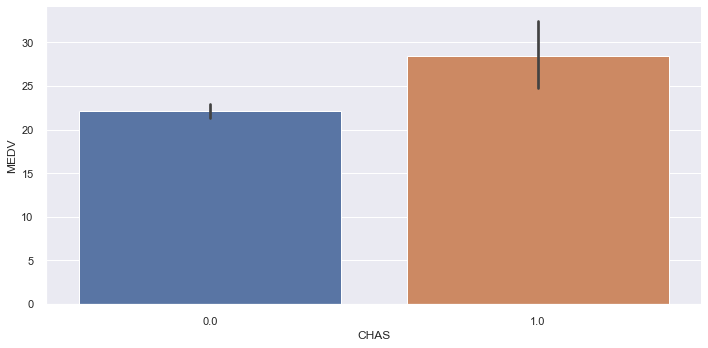

In [32]:
sns.catplot(height=5, aspect=2, x = 'CHAS', y ='MEDV', data = boston, kind = "bar")

In [33]:
boston.loc[boston['CHAS'] == 1]["MEDV"].describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [34]:
boston.loc[boston['CHAS'] == 0]["MEDV"].describe()

count    471.000000
mean      22.093843
std        8.831362
min        5.000000
25%       16.600000
50%       20.900000
75%       24.800000
max       50.000000
Name: MEDV, dtype: float64

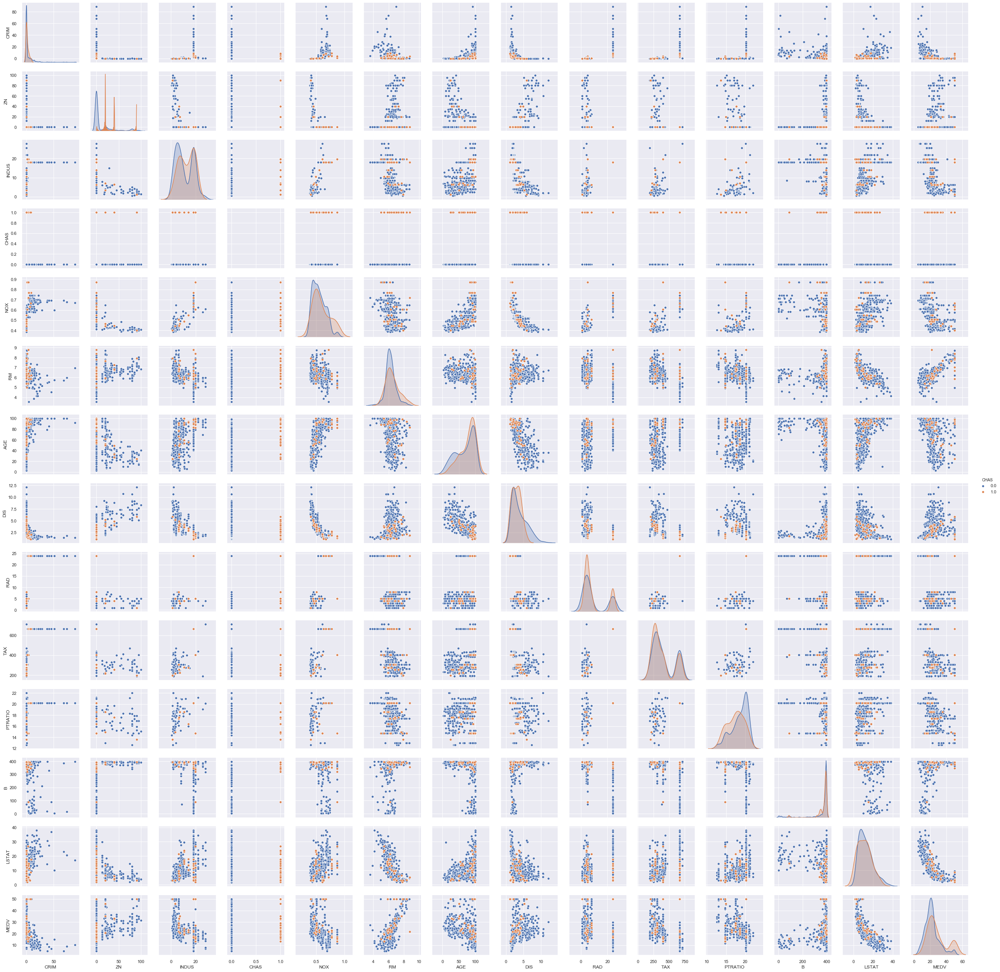

In [35]:
# A 14 x14 plot! 
sns.pairplot(boston, hue = "CHAS")

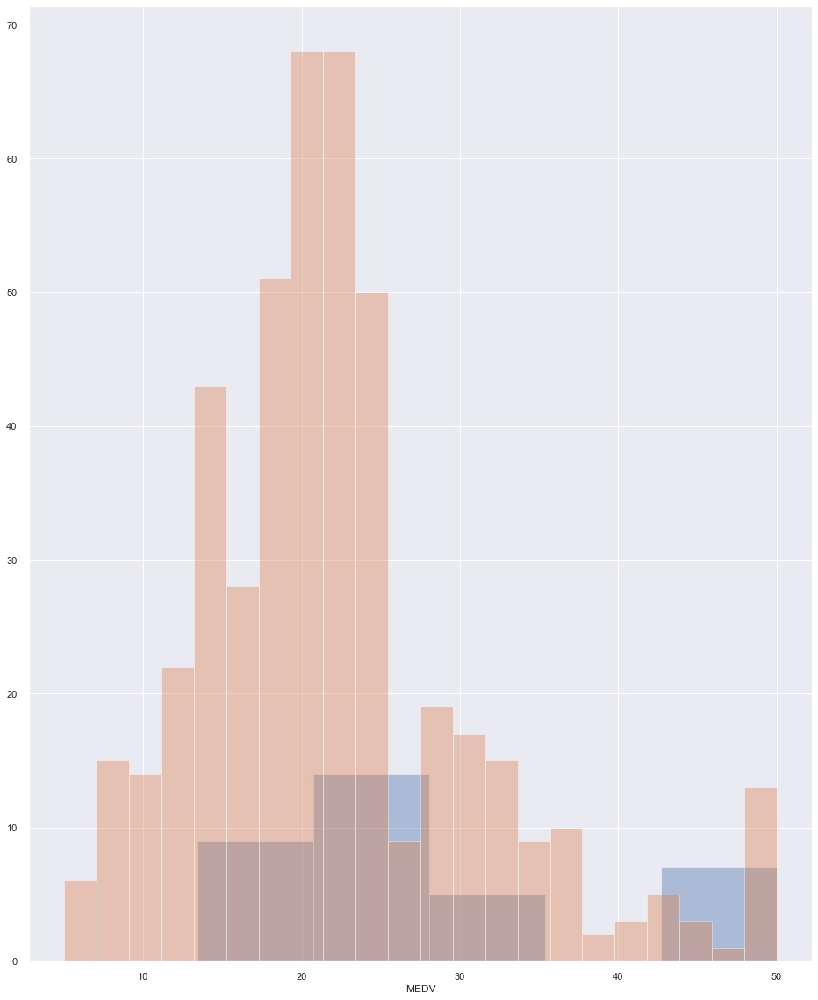

In [36]:
sns.distplot(boston.loc[boston['CHAS'] == 1]["MEDV"],  kde=False,label='Next to River')
sns.distplot(boston.loc[boston['CHAS'] != 1]["MEDV"],  kde=False,label='Not Next to River')

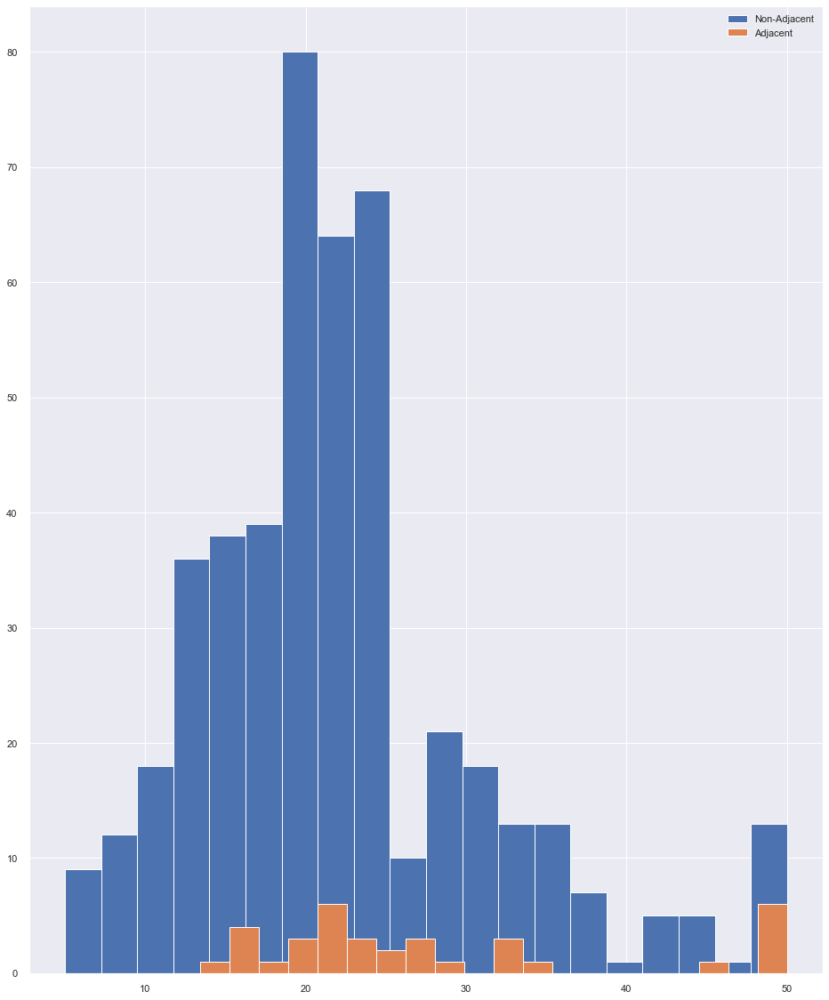

In [37]:
plt.hist(boston.loc[boston['CHAS'] != 1]["MEDV"], label='Non-Adjacent', bins = 20)
plt.hist(boston.loc[boston['CHAS'] == 1]["MEDV"], label='Adjacent', bins = 20)

plt.legend()

plt.show()

In [38]:
# Perform t-test on the two datasets:
import scipy.stats as stats
stats.ttest_ind(boston.loc[boston['CHAS'] == 1]["MEDV"], boston.loc[boston['CHAS'] == 0]["MEDV"])

Ttest_indResult(statistic=3.996437466090509, pvalue=7.390623170519905e-05)

The result above would indicate that these datasets were distinctly different with only a very small probability of the two being confused (p-value of 7.4 x 10^-5). This would appear at odds with the visual appearance of the histogram above however.  

Taking a closer look at the histogram - there appears to be a large amount of outliers in those houses adjacent to the Charles River.

In [39]:
#boston.loc[boston["MEDV"]<50.0, boston['CHAS'] == 1 ]["MEDV"]
no_chas = boston.loc[boston['CHAS'] == 0]
yes_chas = boston.loc[boston['CHAS'] == 1]

In [40]:
# Perform t-test on the two amended datasets:
stats.ttest_ind(no_chas.loc[no_chas['MEDV'] < 50.0]["MEDV"],yes_chas.loc[yes_chas["MEDV"] < 50.0]["MEDV"])

Ttest_indResult(statistic=-1.6571053443179937, pvalue=0.09814089320087695)

With the outliers removed - it is not possible to distinguish the two datasets.

In [43]:
import keras as ks

## (60%) Predict: ##
Again using the same notebook, use keras [7] to create a neural network that can predict the median house price based on the other variables in the dataset. You are free to interpret this as you wish — for example, you may use all the other variables, or select a subset. This part is worth 60%.

## References ##
[1] Boston Standard Metropolitan Statistical Area. Boston house prices dataset. https://www.kaggle.com/c/boston-housing.  
[2] https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155  
[3] https://pypi.org/project/tabulate/  
[4] Tensorflow Installation https://www.youtube.com/channel/UCR1-GEpyOPzT2AO4D_eifdw   
[5] 